# <font color='Red'>Bibliotecas</font>

In [38]:
# -----------------------------
# Manipulación y procesamiento de datos
# -----------------------------
import numpy as np  # para operaciones numéricas
import pandas as pd  # para el procesamiento de datos, lectura de archivos CSV (por ejemplo, pd.read_csv)
from scipy import stats  # para pruebas estadísticas
from scipy.stats import shapiro  # para la prueba estadística de Shapiro-Wilk
import scipy.cluster.hierarchy as sch  # para clustering jerárquico

# -----------------------------
# Aprendizaje automático
# -----------------------------
from sklearn.cluster import KMeans  # para clustering K-means
from sklearn.compose import ColumnTransformer  # para transformar columnas selectivamente
from sklearn.ensemble import RandomForestClassifier, IsolationForest  # para el clasificador Random Forest y IsolationForest
from sklearn.impute import SimpleImputer  # para manejar datos faltantes
from sklearn.model_selection import train_test_split  # para dividir los datos en conjuntos de entrenamiento y prueba
from sklearn.pipeline import Pipeline  # para crear pipelines de transformación y modelo
from sklearn.preprocessing import LabelEncoder, OneHotEncoder, RobustScaler, StandardScaler  # para escalado y codificación
from sklearn.tree import DecisionTreeClassifier  # para el clasificador de árbol de decisión

# -----------------------------
# Métricas y evaluación
# -----------------------------
from sklearn.metrics import (  # para evaluar el rendimiento del modelo
    accuracy_score,
    classification_report,
    confusion_matrix,
    f1_score,
)

# -----------------------------
# Visualización
# -----------------------------
import matplotlib.pyplot as plt  # para crear gráficos estáticos
import seaborn as sns  # para la visualización estadística de datos
import plotly.express as px  # para gráficos interactivos
import plotly.graph_objects as go  # para crear gráficos interactivos avanzados

# -----------------------------
# Manejo de rutas de archivos
# -----------------------------
from pathlib import Path  # para manipulación de rutas de archivos
# from google.colab import drive # conectar drive

# -----------------------------
# Establecer el estado aleatorio para la reproducibilidad
# -----------------------------
random_state = 42


# <font color='Red'> Datos</font>

**Importamos datos**

In [39]:
# from google.colab import drive
# import pandas as pd

# # Montar Google Drive
# drive.mount('/content/drive')

# # Definir la ruta del archivo en "Mi unidad"
# path = "/content/drive/My Drive/X-IIoTID dataset.csv"  # Ruta de acceso drive

# # path = Path("..") / "input" / "dataset" / "/content/X-IIoTID dataset.csv"  # Ruta de acceso local

# # Cargar el archivo CSV
# try:
#     df = pd.read_csv(path, low_memory=False)  # low_memory=False para evitar problemas de tipos mixtos
#     print("Archivo cargado exitosamente.")
#     print(f"El conjunto de datos tiene {df.shape[0]} filas y {df.shape[1]} columnas.")
# except FileNotFoundError:
#     print("El archivo no se encontró en la ruta especificada. Verifica que la ruta sea correcta.")
# except Exception as e:
#     print(f"Ocurrió un error al cargar el archivo: {e}")

import os


path = os.path.join("X-IIoTID dataset.csv")  
try:
    df = pd.read_csv(path, low_memory=False)
    print(f"✅ Datos cargados: {df.shape[0]} filas, {df.shape[1]} columnas.")
except FileNotFoundError:
    print("❌ Error: No se encontró el archivo.")


✅ Datos cargados: 820834 filas, 68 columnas.


**Calcular** el número de casos (filas) y variables (columnas) del dataset


In [4]:
df.shape

(820834, 68)

**Informacion sobre las columnas del dataset**

In [149]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 820834 entries, 0 to 820833
Data columns (total 68 columns):
 #   Column                       Non-Null Count   Dtype 
---  ------                       --------------   ----- 
 0   Date                         820503 non-null  object
 1   Timestamp                    820537 non-null  object
 2   Scr_IP                       820834 non-null  object
 3   Scr_port                     820834 non-null  object
 4   Des_IP                       820834 non-null  object
 5   Des_port                     820834 non-null  object
 6   Protocol                     820834 non-null  object
 7   Service                      820834 non-null  object
 8   Duration                     820834 non-null  object
 9   Scr_bytes                    820834 non-null  object
 10  Des_bytes                    820834 non-null  object
 11  Conn_state                   820834 non-null  int64 
 12  missed_bytes                 820834 non-null  object
 13  is_syn_only   

In [150]:
include = "all"
df.describe(include = include).T

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
Date,820503,49,24/02/2020,147621,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Timestamp,820537,218989,1578542119,5631,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Scr_IP,820834,36,192.168.2.199,156023,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Scr_port,820834,57460,5353,2889,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Des_IP,820834,96,192.168.2.10,312684,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Des_port,820834,6444,80,237640,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Protocol,820834,4,tcp,422334,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Service,820834,17,http,237738,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Duration,820834,330207,-,75761,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Scr_bytes,820834,21054,-,223871,NaN,NaN,NaN,NaN,NaN,NaN,NaN


Distribucion del dataset respecto a la variable objetivo

In [151]:
df['class3'].value_counts()

,count
class3,
Normal,421417
Attack,399417


## Arreglo de columnas con atributos erroneos

In [40]:
def fix_dtype(df, umbral_numerico=0.7):
    object_cols = df.select_dtypes(include=['object']).columns
    int_cols = df.select_dtypes(include=['int64']).columns
    bool_cols = df.select_dtypes(include=['bool']).columns

    # Convertir booleanos a float
    df[bool_cols] = df[bool_cols].astype(float)

    for col in object_cols:
        valores_unicos = df[col].dropna().unique()

        if {"true", "false"} <= set(valores_unicos):  # Verifica si ambos existen
            df[col] = df[col].map({'true': 1, 'false': 0}).astype(float)
        else:
            converted = pd.to_numeric(df[col], errors='coerce')
            if converted.notna().mean() > umbral_numerico:
                df[col] = converted.astype(float)

    for col in int_cols:
        df[col] = df[col].astype(float)

    return df

# Reemplazos comunes de valores
common_replacements = {
    '-': np.nan,
    '?': np.nan,
    'nan': np.nan,
}

def replace_common_values(df):
    """Reemplaza valores comunes como '-', '?' y 'nan' por NaN."""
    for col in df.select_dtypes(include=['object']).columns:
        df[col] = df[col].replace(common_replacements)
    return df

def fix_mayus(df):
    for col in df.select_dtypes(include=['object']).columns:
        df[col] = df[col].str.lower()
    return df


In [41]:
# Aplicar las funciónes al DataFrame
df_converted = replace_common_values(df)
df_converted = fix_mayus(df)
df_converted = fix_dtype(df)

In [42]:
null_Values = df_converted.isnull().sum()
null_Values = null_Values[null_Values > 0]
null_Values = null_Values.sort_values(ascending=False)
print(null_Values)

byte_rate           223872
Des_bytes_ratio     223872
Scr_bytes_ratio     223872
total_bytes         223872
Scr_bytes           223871
Des_bytes           223871
paket_rate          223871
Scr_ip_bytes        152744
Scr_packts_ratio    152743
Scr_pkts            152743
Des_pkts            152743
Des_ip_bytes        152743
Des_pkts_ratio      152743
total_packet        152743
Duration             75761
Avg_kbmemused         1113
Std_kbmemused         1113
Std_ldavg_1            526
Avg_ldavg_1            526
Avg_user_time          500
Avg_wtps               492
Avg_tps                492
Avg_rtps               492
Std_tps                492
Std_rtps               492
Std_wtps               492
Avg_system_time        485
Avg_iowait_time        485
Std_iowait_time        485
Std_system_time        485
Std_user_time          480
Avg_nice_time          480
Std_nice_time          480
Avg_ideal_time         480
Std_ideal_time         480
Avg_num_Proc/s         479
Avg_num_cswch/s        479
S

In [15]:
columnas_excepcion = [
    'byte_rate',
    'Des_bytes_ratio',
    'Scr_bytes_ratio',
    'total_bytes',
    'Scr_bytes',
    'Des_bytes',
    'paket_rate',
    'Scr_ip_bytes',
    'Scr_packts_ratio',
    'Scr_pkts',
    'Des_pkts',
    'Des_ip_bytes',
    'Des_pkts_ratio',
    'total_packet',
    'Duration'
]

In [162]:
no_borrar = [col for col in df_converted.columns if col not in columnas_excepcion]

In [163]:
df_converted = df_converted.dropna(subset=no_borrar)
df_converted.shape

(819182, 68)

In [164]:
# for col in object_columns:
#   print(f'{col}: {df_converted[col].unique()}\n')

In [165]:
df_converted.info()

<class 'pandas.core.frame.DataFrame'>
Index: 819182 entries, 0 to 820833
Data columns (total 68 columns):
 #   Column                       Non-Null Count   Dtype  
---  ------                       --------------   -----  
 0   Date                         819182 non-null  object 
 1   Timestamp                    819182 non-null  float64
 2   Scr_IP                       819182 non-null  object 
 3   Scr_port                     819182 non-null  float64
 4   Des_IP                       819182 non-null  object 
 5   Des_port                     819182 non-null  float64
 6   Protocol                     819182 non-null  object 
 7   Service                      819182 non-null  object 
 8   Duration                     743708 non-null  float64
 9   Scr_bytes                    596018 non-null  float64
 10  Des_bytes                    596018 non-null  float64
 11  Conn_state                   819182 non-null  bool   
 12  missed_bytes                 819182 non-null  float64
 13  is_s

# <font color='Red'>Particion de datos Train y Test</font>

In [8]:
X = df_converted.drop(columns=['class1', 'class2', 'class3'])
y = df_converted['class3']
y = y.replace({'normal': 0, 'attack': 1})

print(X.shape, y.shape)

(820834, 65) (820834,)


C:\Users\rafae\AppData\Local\Temp\ipykernel_12504\641063137.py:3: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  y = y.replace({'normal': 0, 'attack': 1})


In [9]:
clases = df_converted[['class3', 'class2', 'class1']]

In [10]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=random_state, stratify=y)

X_train.shape, X_test.shape, y_train.shape, y_test.shape

((656667, 65), (164167, 65), (656667,), (164167,))

In [16]:
X_train[columnas_excepcion].isnull().sum()

byte_rate           179396
Des_bytes_ratio     179396
Scr_bytes_ratio     179396
total_bytes         179396
Scr_bytes           179395
Des_bytes           179395
paket_rate          179395
Scr_ip_bytes        122396
Scr_packts_ratio    122395
Scr_pkts            122395
Des_pkts            122395
Des_ip_bytes        122395
Des_pkts_ratio      122395
total_packet        122395
Duration             60692
dtype: int64

In [17]:
imputer = SimpleImputer(strategy='mean')

X_train[columnas_excepcion] = imputer.fit_transform(X_train[columnas_excepcion])

In [18]:
X_train[columnas_excepcion].isnull().sum()

byte_rate           0
Des_bytes_ratio     0
Scr_bytes_ratio     0
total_bytes         0
Scr_bytes           0
Des_bytes           0
paket_rate          0
Scr_ip_bytes        0
Scr_packts_ratio    0
Scr_pkts            0
Des_pkts            0
Des_ip_bytes        0
Des_pkts_ratio      0
total_packet        0
Duration            0
dtype: int64


# <font color='Red'>Analisis exploratorio no temporal</font>



In [44]:
boolean_columns = X_train.select_dtypes(include=['bool']).columns
boolean_as_int = X_train[boolean_columns].astype(int)

categorical_columns = X_train.drop(columns=['Date'], errors='ignore').select_dtypes(include=['object']).columns

numerical_columns = X_train.drop(columns=['Timestamp'], errors='ignore').select_dtypes(include=['float64', 'int64']).columns
numerical_columns = numerical_columns.tolist() + boolean_columns.tolist()

# No tengo en cuenta las booleanas
int_columns = X_train.select_dtypes(include=['int64']).columns
float_columns = X_train.drop(columns=['Timestamp'], errors='ignore').select_dtypes(include=['float64']).columns




## Frecuencia

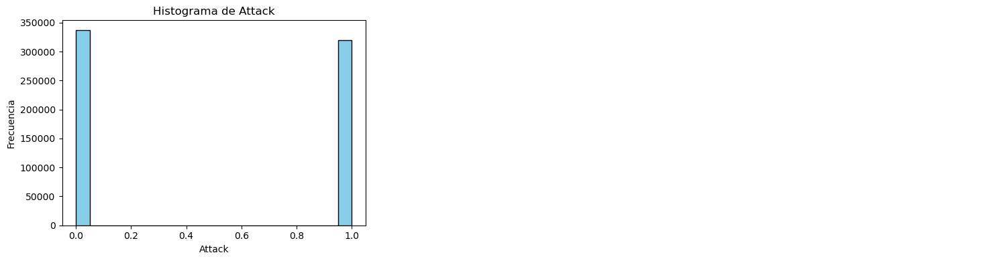

In [20]:
# Número de columnas de tipo int64
n_int = len(int_columns)

# Calcular el número de filas necesarias para los histogramas (máximo 3 columnas por fila)
n_rows_int = (n_int // 3) + (n_int % 3 > 0)

# Crear las subgráficas para int64
fig_int, axes_int = plt.subplots(nrows=n_rows_int, ncols=3, figsize=(15, n_rows_int * 4))
axes_int = axes_int.flatten()

# Graficar los histogramas para las columnas int64
for i, col in enumerate(int_columns):
    axes_int[i].hist(X_train[col], bins=20, color='skyblue', edgecolor='black')
    axes_int[i].set_title(f"Histograma de {col}")
    axes_int[i].set_xlabel(col)
    axes_int[i].set_ylabel('Frecuencia')

# Ocultar los subgráficos vacíos en int64
for j in range(i + 1, len(axes_int)):
    axes_int[j].axis('off')

# Ajustar los gráficos para que no se sobrepongan y agregar espacio entre ellos
plt.subplots_adjust(hspace=0.5, wspace=0.3)

# Mostrar los gráficos
plt.tight_layout()
plt.show()

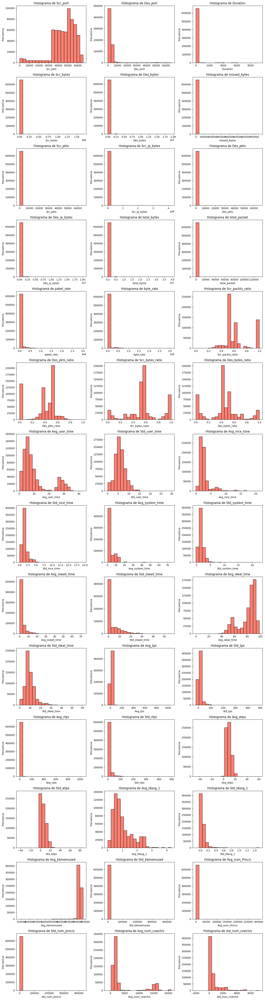

In [134]:
# Número de columnas de tipo float64
n_float = len(float_columns)

# Calcular el número de filas necesarias para los histogramas (máximo 3 columnas por fila)
n_rows_float = (n_float // 3) + (n_float % 3 > 0)

# Crear las subgráficas para float64
fig_float, axes_float = plt.subplots(nrows=n_rows_float, ncols=3, figsize=(15, n_rows_float * 4))
axes_float = axes_float.flatten()

# Graficar los histogramas para las columnas float64
for i, col in enumerate(float_columns):
    axes_float[i].hist(X_train[col], bins=20, color='salmon', edgecolor='black')
    axes_float[i].set_title(f"Histograma de {col}")
    axes_float[i].set_xlabel(col)
    axes_float[i].set_ylabel('Frecuencia')

# Ocultar los subgráficos vacíos en float64
for j in range(i + 1, len(axes_float)):
    axes_float[j].axis('off')

# Ajustar los gráficos para que no se sobrepongan y agregar espacio entre ellos
plt.subplots_adjust(hspace=0.5, wspace=0.3)

# Mostrar los gráficos
plt.tight_layout()
plt.show()


## Correlacion

In [48]:
import pandas as pd
from sklearn.feature_selection import mutual_info_classif
from sklearn.impute import SimpleImputer

# Copia segura del dataset original
X_processed = X_train.copy()

# --- Eliminar columnas de fecha si no quieres usarlas como features ---
X_processed = X_processed.drop(columns=['Date', 'Timestamp'], errors='ignore')

# --- Detectar columnas booleanas y categóricas ---
boolean_columns = X_processed.select_dtypes(include=['bool']).columns
categorical_columns = X_processed.select_dtypes(include=['object']).columns

# --- Convertir booleanos a enteros ---
X_processed[boolean_columns] = X_processed[boolean_columns].astype(int)

# --- One-hot encoding para las categóricas ---
X_processed = pd.get_dummies(X_processed, columns=categorical_columns)

# --- Imputar valores nulos ---
imputer = SimpleImputer(strategy='most_frequent')  # 'mean' también es válido para numéricos
X_imputed = pd.DataFrame(imputer.fit_transform(X_processed), columns=X_processed.columns)

# --- Calcular información mutua ---
mi = mutual_info_classif(X_imputed, y_train, discrete_features='auto')

Attack                  0.790100
Scr_ip_bytes            0.489471
Traffic                 0.449924
Scr_bytes               0.448783
Std_user_time           0.445436
                          ...   
Des_IP_157.240.7.20     0.000000
Des_IP_157.240.7.169    0.000000
Des_IP_157.240.3.63     0.000000
Des_IP_157.240.3.20     0.000000
Des_IP_13.107.4.52      0.000000
Length: 207, dtype: float64


In [50]:
pd.set_option('display.max_rows', None)

# Mostrar los resultados ordenados de información mutua
mi_series = pd.Series(mi, index=X_imputed.columns).sort_values(ascending=False)
print(mi_series)

Attack                              0.790100
Scr_ip_bytes                        0.489471
Traffic                             0.449924
Scr_bytes                           0.448783
Std_user_time                       0.445436
std_num_cswch/s                     0.445313
Std_ideal_time                      0.445133
total_bytes                         0.444330
Std_nice_time                       0.443608
Std_kbmemused                       0.443599
Std_system_time                     0.443213
Avg_kbmemused                       0.398921
Avg_ideal_time                      0.381215
Des_ip_bytes                        0.374354
Scr_bytes_ratio                     0.372293
Des_bytes_ratio                     0.368208
Avg_num_cswch/s                     0.362909
Avg_user_time                       0.354236
Std_iowait_time                     0.350277
Std_tps                             0.339994
Des_port                            0.336016
Des_bytes                           0.335876
Avg_system

In [ ]:
import pandas as pd

# Copia segura del dataset
X_corr = X_train.copy()

# Eliminar columnas de fecha si no las quieres como features
X_corr = X_corr.drop(columns=['Date', 'Timestamp'], errors='ignore')

# Convertir booleanas a int
bool_cols = X_corr.select_dtypes(include='bool').columns
X_corr[bool_cols] = X_corr[bool_cols].astype(int)

# Convertir categóricas a variables dummies
cat_cols = X_corr.select_dtypes(include='object').columns
X_corr = pd.get_dummies(X_corr, columns=cat_cols)

# Calcular la matriz de correlación
correlation_matrix = X_corr.corr()

# Opcional: ver solo correlaciones con la variable objetivo si esta forma parte de X_train
# correlation_with_target = correlation_matrix['target_column'].sort_values(ascending=False)

# Mostrar correlación completa
print(correlation_matrix)


In [34]:
# Calcular la correlación con cada variable objetivo

correlations_with_target = X_train[numerical_columns].corrwith(y_train)

# Convertir la serie de correlación a un DataFrame
correlations_df = correlations_with_target.reset_index()
correlations_df.columns = ['Feature', 'Correlation']  # Renombrar las columnas

# Crear un gráfico de barras de las correlaciones para cada una de las variables objetivo
fig = px.bar(
    correlations_df,
    x="Feature",
    y="Correlation",
    title='Correlación de Variables con las Variables Objetivo',
    labels={'Correlation': 'Coeficiente de Correlación', 'Feature': 'Variable'},
    color='Correlation',  # Color según el valor de la correlación
    color_continuous_scale=px.colors.sequential.Plasma
)

# Mostrar el gráfico
fig.show()


correlation_matrix = X_train[numerical_columns].corr()

fig = px.imshow(correlation_matrix,
                color_continuous_scale='Viridis',
                title="Matriz de Correlación entre Variables Numéricas y Booleanas",
                labels={'x': 'Variables', 'y': 'Variables', 'color': 'Coeficiente de Correlación'})

# Mostrar el gráfico interactivo
fig.show()

c:\Users\rafae\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning:

invalid value encountered in divide

c:\Users\rafae\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning:

invalid value encountered in divide



## Grupos de variables altamente correlacionadas

In [136]:
X_train[numerical_columns].nunique()

,0
Scr_port,55031
Des_port,6356
Duration,271082
Scr_bytes,18500
Des_bytes,42868
missed_bytes,187
Scr_pkts,1097
Scr_ip_bytes,29019
Des_pkts,1434
Des_ip_bytes,45974


<ipython-input-137-c26df9a1006a>:13: ClusterWarning:

The symmetric non-negative hollow observation matrix looks suspiciously like an uncondensed distance matrix



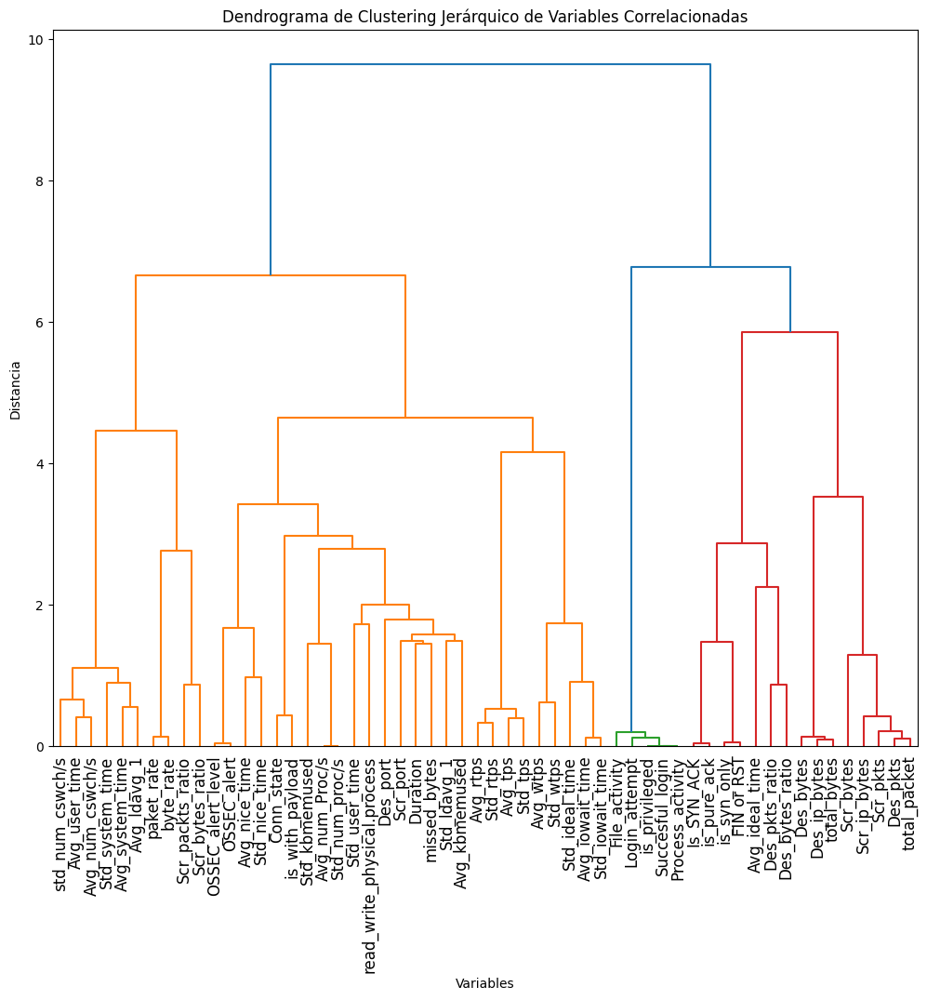

In [137]:
# Eliminar columnas constantes
non_constant_columns = X_train[numerical_columns].nunique() > 1  # Mantener solo las columnas con más de un valor único
filtered_columns = X_train[numerical_columns].loc[:, non_constant_columns].columns
X_filtered = X_train[filtered_columns]

# Calcular la matriz de correlación nuevamente
correlation_matrix = X_filtered.corr()

# Calcular la matriz de distancias (1 - correlación)
distance_matrix = 1 - correlation_matrix

# Aplicar clustering jerárquico
linkage_matrix = sch.linkage(distance_matrix, method='ward')

# Visualizar el dendrograma
plt.figure(figsize=(12, 10))
sch.dendrogram(linkage_matrix, labels=correlation_matrix.columns, orientation='top', leaf_rotation=90, leaf_font_size=12)
plt.title("Dendrograma de Clustering Jerárquico de Variables Correlacionadas")
plt.xlabel("Variables")
plt.ylabel("Distancia")
plt.show()


In [138]:
correlation_df = correlation_matrix.abs()  # Usamos el valor absoluto de la correlación

# Establecemos un umbral para identificar las correlaciones más altas
threshold = 0.8  # Puedes ajustar este valor dependiendo de cuán altas quieras las correlaciones

# Encontramos las variables más relevantes: aquellas que tienen correlaciones mayores al umbral con otras variables
highly_correlated = correlation_df[correlation_df > threshold].stack().reset_index()
highly_correlated.columns = ['Variable 1', 'Variable 2', 'Correlación']

# Eliminamos las correlaciones de una variable consigo misma
highly_correlated = highly_correlated[highly_correlated['Variable 1'] != highly_correlated['Variable 2']]

# Cambiar la configuración de pandas para mostrar todas las filas
pd.set_option('display.max_rows', None)
# Mostrar las variables altamente correlacionadas
print("Variables altamente correlacionadas:")
print(highly_correlated)


Variables altamente correlacionadas:
            Variable 1         Variable 2  Correlación
5            Des_bytes       Des_ip_bytes     0.988462
6            Des_bytes        total_bytes     0.996011
9             Scr_pkts       Scr_ip_bytes     0.935433
10            Scr_pkts           Des_pkts     0.970019
11            Scr_pkts       total_packet     0.992178
12        Scr_ip_bytes           Scr_pkts     0.935433
14        Scr_ip_bytes           Des_pkts     0.925673
15        Scr_ip_bytes       total_packet     0.937509
16            Des_pkts           Scr_pkts     0.970019
17            Des_pkts       Scr_ip_bytes     0.925673
19            Des_pkts       total_packet     0.992769
20        Des_ip_bytes          Des_bytes     0.988462
22        Des_ip_bytes        total_bytes     0.996030
23         total_bytes          Des_bytes     0.996011
24         total_bytes       Des_ip_bytes     0.996030
26        total_packet           Scr_pkts     0.992178
27        total_packet      

### Matrices de correlacion int, float, boolean

In [139]:
# Visualización de la matriz de correlación para las columnas de tipo int64 con Plotly
correlations_with_target_int = X_train[int_columns].corr()

# Crear la figura de la matriz de correlación
fig_int = go.Figure(data=go.Heatmap(
    z=correlations_with_target_int.values,
    x=correlations_with_target_int.columns,
    y=correlations_with_target_int.columns,
    colorscale='Viridis',  # Escala de color Viridis
    colorbar=dict(title="Coeficiente de Correlación"),
    zmin=-1, zmax=1  # Limitar el rango de los coeficientes de correlación
))

# Mejorar el diseño de la matriz de correlación
fig_int.update_layout(
    title="Matriz de Correlación (Int64)",
    xaxis_title="Características",
    yaxis_title="Características",
    title_x=0.5  # Centrar el título
)

# Mostrar el gráfico de la matriz de correlación
fig_int.show()

# Visualización de la matriz de correlación para las columnas de tipo float64 con Plotly
correlations_with_target_float = X_train[float_columns].corr()

# Crear la figura de la matriz de correlación
fig_float = go.Figure(data=go.Heatmap(
    z=correlations_with_target_float.values,
    x=correlations_with_target_float.columns,
    y=correlations_with_target_float.columns,
    colorscale='Viridis',  # Escala de color Viridis
    colorbar=dict(title="Coeficiente de Correlación"),
    zmin=-1, zmax=1  # Limitar el rango de los coeficientes de correlación
))

# Mejorar el diseño de la matriz de correlación
fig_float.update_layout(
    title="Matriz de Correlación (Float64)",
    xaxis_title="Características",
    yaxis_title="Características",
    title_x=0.5  # Centrar el título
)

# Mostrar el gráfico de la matriz de correlación
fig_float.show()

# Visualización de la matriz de correlación para las columnas de tipo boolean con Plotly
correlations_with_target_float = boolean_as_int.corr()

# Crear la figura de la matriz de correlación
fig_float = go.Figure(data=go.Heatmap(
    z=correlations_with_target_float.values,
    x=correlations_with_target_float.columns,
    y=correlations_with_target_float.columns,
    colorscale='Viridis',  # Escala de color Viridis
    colorbar=dict(title="Coeficiente de Correlación"),
    zmin=-1, zmax=1  # Limitar el rango de los coeficientes de correlación
))

# Mejorar el diseño de la matriz de correlación
fig_float.update_layout(
    title="Matriz de Correlación (Int64)",
    xaxis_title="Características",
    yaxis_title="Características",
    title_x=0.5  # Centrar el título
)

# Mostrar el gráfico de la matriz de correlación
fig_float.show()

#### Gráficos de dispersión (scatter plots) para pares de variables numéricas con alta correlación

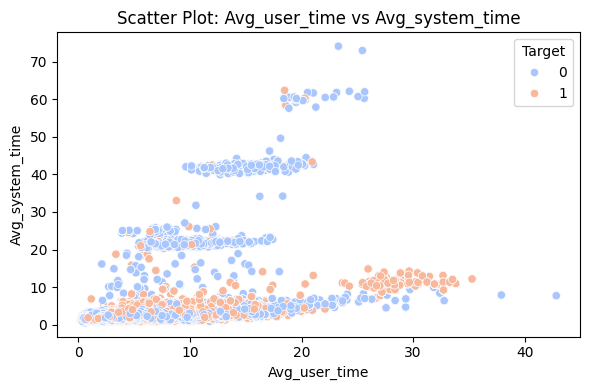

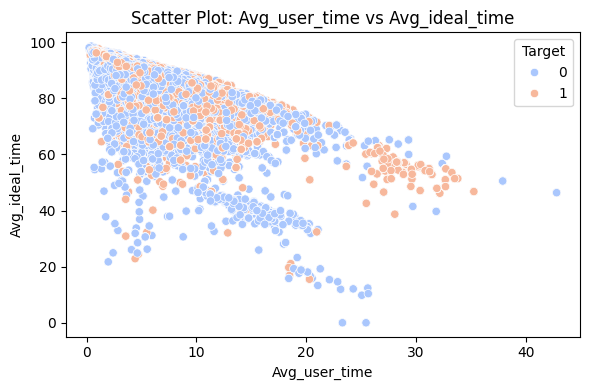

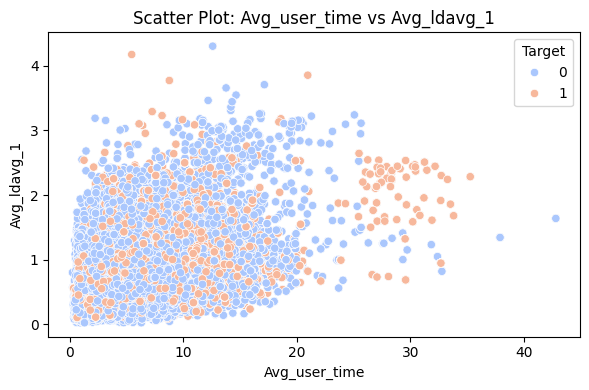

KeyboardInterrupt: 

In [140]:
# Umbral para considerar una correlación como alta
correlation_threshold = 0.35

# Filtrar las variables numéricas con alta correlación (positiva o negativa)
high_corr_vars = correlations_with_target[correlations_with_target.abs() > correlation_threshold].index.tolist()

# Crear gráficos de dispersión para pares de variables con alta correlación
if len(high_corr_vars) > 1:
    for i, var1 in enumerate(high_corr_vars):
        for j, var2 in enumerate(high_corr_vars):
            if i < j:  # Evitar pares duplicados
                plt.figure(figsize=(6, 4))
                sns.scatterplot(data=X_train, x=var1, y=var2, hue=y_train, palette="coolwarm")
                plt.title(f"Scatter Plot: {var1} vs {var2}")
                plt.xlabel(var1)
                plt.ylabel(var2)
                plt.legend(title='Target')
                plt.tight_layout()  # Asegura espacio entre elementos
                plt.show()
else:
    print("No hay suficientes variables con alta correlación para generar gráficos.")


## Relaciones No Lineales (a implementar variables mas importantes)

### Visualización en 3D

In [ ]:
# Seleccionar tres variables numéricas para el gráfico 3D
selected_columns = ['Scr_bytes', 'Des_bytes', 'Traffic']

# Crear un gráfico interactivo 3D con Plotly
fig = px.scatter_3d(X_train, x=selected_columns[0], y=selected_columns[1], z=selected_columns[2],
                    title="Distribución 3D de Variables",
                    labels={selected_columns[0]: 'Scr_bytes', selected_columns[1]: 'Des_bytes', selected_columns[2]: 'Total_bytes'})

# Mostrar el gráfico interactivo
fig.show()


### Análisis de Clústeres con K-Means

In [ ]:
# Seleccionar las variables numéricas que usaremos para el clustering
X_cluster = X_train[selected_columns]

# Aplicar K-Means (especificando el número de clústeres, por ejemplo 3)
kmeans = KMeans(n_clusters=3, random_state=42)
X_train['Cluster'] = kmeans.fit_predict(X_cluster)

# Visualizar los resultados de los clústeres
plt.figure(figsize=(10, 7))
plt.scatter(X_train[selected_columns[0]], X_train[selected_columns[1]], c=X_train['Cluster'], cmap='viridis')
plt.xlabel(selected_columns[0])
plt.ylabel(selected_columns[1])
plt.title("Clústeres con K-Means (2D)")
plt.colorbar(label='Cluster')
plt.show()


## Análisis de distribuciones

#### Prueba de normalidad (Shapiro-Wilk):

In [ ]:
# Prueba de normalidad (Shapiro-Wilk) para variables numéricas
print("Prueba de Shapiro-Wilk para normalidad:\n")
shapiro_results = {}
sample_size = 10000  # Tamaño de muestra aleatoria
random_sample = X_train.sample(n=sample_size, random_state=random_state)

for col in numerical_columns:
    stat, p_value = shapiro(random_sample[col].dropna())
    if p_value < 0.05:
        print(f"{col}: No es normal (p = {p_value:.5f})")
    else:
        print(f"{col}: Normal (p = {p_value:.5f})")

#### Diagramas de densidad

In [ ]:
# Diagramas de densidad para variables numéricas separadas por clases objetivo
for col in numerical_columns:
    plt.figure(figsize=(8, 6))
    sns.kdeplot(data=X_train, x=col, hue=y_train, fill=True, palette="coolwarm", alpha=0.5)
    plt.title(f"Densidad de {col} según clases objetivo")
    plt.xlabel(col)
    plt.ylabel("Densidad")
    plt.legend(title="Clases")
    plt.tight_layout()
    plt.show()

## Outliers

**Outliers** ( Z-Score: (x-mean(X))/std(X) )


In [ ]:
outliers_dict = {}  # Para almacenar los outliers de cada columna

# Excluir las columnas de tipo booleano del cálculo de outliers
for col in X_train.select_dtypes(include=['float64', 'int64']).columns:
    z_scores = stats.zscore(X_train[col])
    outliers = X_train[(z_scores > 3) | (z_scores < -3)]  # Valores atípicos según el z-score
    outliers_dict[col] = outliers
    print(f"Valores anómalos en '{col}': {outliers.shape[0]}")


### Visualizacion en graficas

In [ ]:
# Definir el número de columnas por fila
n_cols = 3
# Calcular el número de filas necesarias para acomodar todas las columnas
n_rows = (len(float_columns) + n_cols - 1) // n_cols

# Configurar el tamaño de la figura
plt.figure(figsize=(n_cols * 5, n_rows * 5))

# Graficar un diagrama de cajas para cada columna en la lista de columnas float
for i, col in enumerate(float_columns):
    # Crear subgráfico en la cuadrícula
    plt.subplot(n_rows, n_cols, i + 1)
    # Crear el diagrama de cajas para la columna, usando dropna() para eliminar los valores NaN
    plt.boxplot(X_train[col].dropna())
    # Establecer el título y etiquetas para el gráfico
    plt.title(f'{col}')
    plt.xlabel('')
    plt.ylabel(col)

# Ajustar el espaciado entre los gráficos
plt.tight_layout()

# Mostrar el gráfico
plt.show()


### Impacto de los Outliers

In [ ]:
# Selección de variables numéricas para la visualización
selected_columns = ['Scr_bytes', 'Des_bytes']

# Visualizar los puntos antes de eliminar los outliers (con la variable 'Attack' para colorear)
plt.figure(figsize=(12, 8))

# Gráfico de dispersión con todos los puntos (sin eliminación de outliers)
plt.subplot(1, 2, 1)
plt.scatter(X_train[selected_columns[0]], X_train[selected_columns[1]], c=X_train['Attack'], cmap='coolwarm', alpha=0.5)
plt.title("Gráfico de Dispersión con Outliers (coloreado por Attack)")
plt.xlabel(selected_columns[0])
plt.ylabel(selected_columns[1])

# Ajustar la visualización
plt.tight_layout()
plt.show()


## Análisis de valores categóricos

#### Tablas cruzadas

In [ ]:
# Distribuciones conjuntas: Tablas cruzadas y gráficos de barras
for cat_col in categorical_columns:
    crosstab = pd.crosstab(X_train[cat_col], y_train)
    print(f"Tabla cruzada para {cat_col}:\n", crosstab)

    # Gráfico de barras apilado
    crosstab.plot(kind='bar', stacked=True, figsize=(8, 6), colormap="coolwarm")
    plt.title(f"Distribución conjunta: {cat_col} y Clase objetivo")
    plt.xlabel(cat_col)
    plt.ylabel("Frecuencia")
    plt.legend(title="Clase objetivo")
    plt.tight_layout()
    plt.show()

#### Balance de clases y sobremuestreo (SMOTE)

In [ ]:
from sklearn.utils.class_weight import compute_class_weight
from imblearn.over_sampling import SMOTE

# Análisis del balance de clases
class_counts = y_train.value_counts()
print("\nDistribución de la clase objetivo:")
print(class_counts)

# Visualizar balance de clases
plt.figure(figsize=(6, 4))
sns.barplot(x=class_counts.index, y=class_counts.values, palette="coolwarm")
plt.title("Distribución de la Clase Objetivo")
plt.xlabel("Clases")
plt.ylabel("Frecuencia")
plt.tight_layout()
plt.show()


# FALTA IMPLEMENTAR CORRECTAMENTE O SABER SI ES NECESARIO

# # Verificar desbalance y aplicar SMOTE si es necesario
# min_class_ratio = class_counts.min() / class_counts.sum()
# print(f"\nProporción mínima de la clase: {min_class_ratio:.2f}")

# if min_class_ratio < 0.5:
#     print("Las clases están desbalanceadas. Aplicando SMOTE...")
#     smote = SMOTE(random_state=42)
#     X_train_resampled, y_train_resampled = smote.fit_resample(X_train, y_train)

#     # Verificar nueva distribución después de SMOTE
#     new_class_counts = pd.Series(y_train_resampled).value_counts()
#     print("\nDistribución de la clase objetivo después de SMOTE:")
#     print(new_class_counts)

#     # Visualizar nuevo balance de clases
#     plt.figure(figsize=(6, 4))
#     sns.barplot(x=new_class_counts.index, y=new_class_counts.values, palette="coolwarm")
#     plt.title("Distribución de la Clase Objetivo (Después de SMOTE)")
#     plt.xlabel("Clases")
#     plt.ylabel("Frecuencia")
#     plt.tight_layout()
#     plt.show()
# else:
#     print("Las clases están balanceadas. No es necesario aplicar SMOTE.")

# <font color='Red'> Análisis exploratorio temporal</font>

In [ ]:
boolean_columns = X_train.select_dtypes(include=['bool']).columns
boolean_as_int = X_train[boolean_columns].astype(int)

categorical_columns = X_train.select_dtypes(include=['object']).columns

numerical_columns = X_train.select_dtypes(include=['float64', 'int64', 'int32']).columns
numerical_columns = numerical_columns.tolist() + boolean_columns.tolist()


# No tengo en cuenta las booleanas
int_columns = X_train.select_dtypes(include=['int64']).columns
float_columns = X_train.select_dtypes(include=['float64']).columns
int32_columns = X_train.select_dtypes(include=['int32']).columns

In [ ]:
# Convertir la columna Date a formato datetime
X_train['Date'] = pd.to_datetime(X_train['Date'], format='%d/%m/%Y')

# Convertir Timestamp a datetime
X_train['Timestamp'] = pd.to_datetime(X_train['Timestamp'], unit='s')

In [ ]:
# Columnas nuevas
X_train['Day_of_week'] = X_train['Date'].dt.dayofweek  # Lunes=0, Domingo=6
X_train['Month'] = X_train['Date'].dt.month
X_train['Year'] = X_train['Date'].dt.year
X_train['Hour'] = X_train['Timestamp'].dt.hour
X_train['Minute'] = X_train['Timestamp'].dt.minute
X_train['Second'] = X_train['Timestamp'].dt.second

In [ ]:
# Lista manual de columnas relacionadas con "bytes"
bytes_columns = [
    'Scr_bytes',
    'Des_bytes',
    'missed_bytes',
    'Scr_ip_bytes',
    'Des_ip_bytes',
    'total_bytes',
    'Scr_bytes_ratio',
    'Des_bytes_ratio'
]

# Seleccionar estas columnas del conjunto de entrenamiento
ejemplo = X_train[bytes_columns]
ejemplo.head()

,Scr_bytes,Des_bytes,missed_bytes,Scr_ip_bytes,Des_ip_bytes,total_bytes,Scr_bytes_ratio,Des_bytes_ratio
99298,7046.0,166118.0,0.0,12150.0,173198.0,358512.0,0.053544,0.946456
18186,74.0,0.0,0.0,130.0,0.0,204.0,1.000000,0.000000
205026,74.0,74.0,0.0,130.0,130.0,408.0,0.500000,0.500000
316491,1121.0,484.0,0.0,1545.0,856.0,4006.0,0.665502,0.334498
152403,0.0,0.0,0.0,164.0,60.0,224.0,0.732143,0.267857


In [ ]:
x = 0
for i in range(5):
  suma = X_train[bytes_columns[i]].head(1).values[0]
  x += suma
print(x)

358512.0


## Visualizacion de trafico en el tiempo

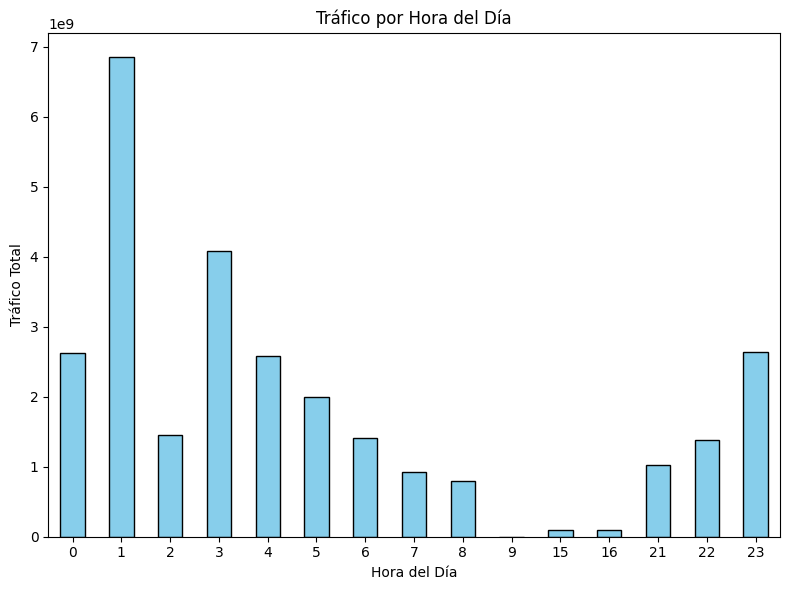

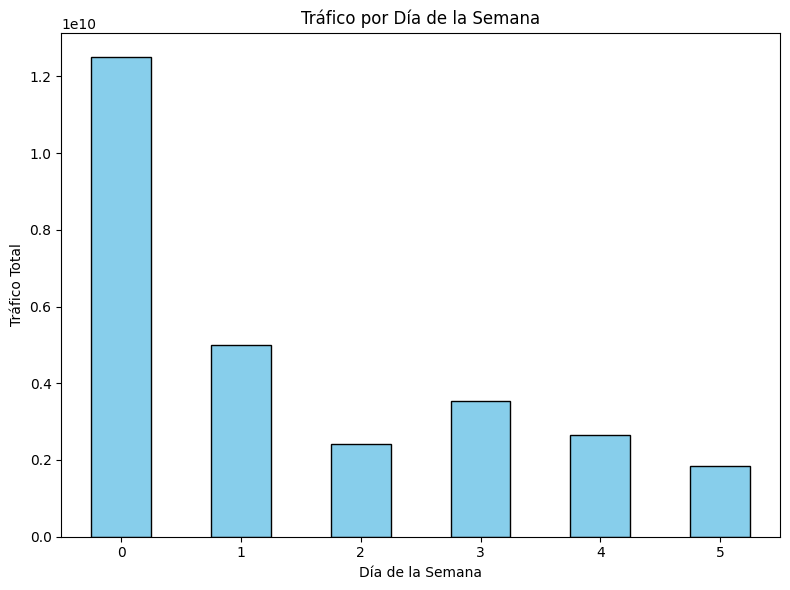

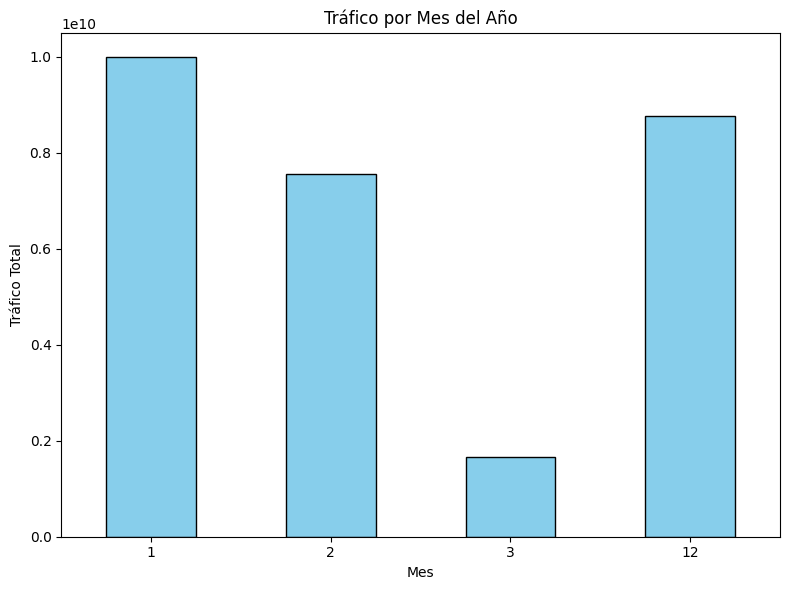

In [ ]:
# Gráfico de tráfico por hora
plt.figure(figsize=(8, 6))
traffic_by_hour = X_train.groupby('Hour')['Traffic'].sum()
traffic_by_hour.plot(kind='bar', color='skyblue', edgecolor='black')
plt.title('Tráfico por Hora del Día')  # Título
plt.xlabel('Hora del Día')  # Etiqueta para el eje X
plt.ylabel('Tráfico Total')  # Etiqueta para el eje Y
plt.xticks(rotation=0)  # Asegura que las etiquetas del eje X no se roten
plt.tight_layout()  # Ajusta el espaciado
plt.show()

# Gráfico de tráfico por día de la semana
plt.figure(figsize=(8, 6))
traffic_by_weekday = X_train.groupby('Day_of_week')['Traffic'].sum()
traffic_by_weekday.plot(kind='bar', color='skyblue', edgecolor='black')
plt.title('Tráfico por Día de la Semana')  # Título
plt.xlabel('Día de la Semana')  # Etiqueta para el eje X
plt.ylabel('Tráfico Total')  # Etiqueta para el eje Y
plt.xticks(rotation=0)  # Asegura que las etiquetas del eje X no se roten
plt.tight_layout()  # Ajusta el espaciado
plt.show()

# Gráfico de tráfico por mes
plt.figure(figsize=(8, 6))
traffic_by_month = X_train.groupby('Month')['Traffic'].sum()
traffic_by_month.plot(kind='bar', color='skyblue', edgecolor='black')
plt.title('Tráfico por Mes del Año')  # Título
plt.xlabel('Mes')  # Etiqueta para el eje X
plt.ylabel('Tráfico Total')  # Etiqueta para el eje Y
plt.xticks(rotation=0)  # Asegura que las etiquetas del eje X no se roten
plt.tight_layout()  # Ajusta el espaciado
plt.show()


## Visualizacion cantidad envio y recepcion de datos

In [ ]:
# Agrupar los datos por 'Month', 'Day_of_week' y 'Hour' para obtener el total de tráfico
heatmap_data = X_train.groupby(['Month', 'Day_of_week', 'Hour'])['Traffic'].sum().reset_index()

# Crear un mapa de calor para cada mes
for month in sorted(X_train['Month'].unique()):
    # Filtrar los datos para el mes específico
    month_data = heatmap_data[heatmap_data['Month'] == month]

    # Pivoteamos los datos para crear una matriz de calor
    heatmap_data_pivot = month_data.pivot_table(index='Day_of_week', columns='Hour', values='Traffic', aggfunc='sum')

    # Crear el mapa de calor con Plotly
    fig = px.imshow(
        heatmap_data_pivot,
        labels={'x': 'Hora del Día', 'y': 'Día de la Semana', 'color': 'Tráfico'},
        title=f'Mapa de Calor de Tráfico para el Mes {month}',
        color_continuous_scale='YlGnBu'  # Puedes usar otras paletas de colores como 'Viridis', 'Cividis', etc.
    )

    # Personalizar las etiquetas
    fig.update_xaxes(tickmode='array', tickvals=list(range(24)), ticktext=[f'{i}:00' for i in range(24)])
    fig.update_yaxes(tickmode='array', tickvals=list(range(7)), ticktext=['Lunes', 'Martes', 'Miércoles', 'Jueves', 'Viernes', 'Sábado', 'Domingo'])

    # Mostrar el gráfico
    fig.show()


### Envio

In [ ]:
# Agrupar los datos por 'Month', 'Day_of_week' y 'Hour' para obtener el total de tráfico
heatmap_data = X_train.groupby(['Month', 'Day_of_week', 'Hour'])['Scr_bytes'].sum().reset_index()

# Crear un mapa de calor para cada mes
for month in sorted(X_train['Month'].unique()):
    # Filtrar los datos para el mes específico
    month_data = heatmap_data[heatmap_data['Month'] == month]

    # Pivoteamos los datos para crear una matriz de calor
    heatmap_data_pivot = month_data.pivot_table(index='Day_of_week', columns='Hour', values='Scr_bytes', aggfunc='sum')

    # Crear el mapa de calor con Plotly
    fig = px.imshow(
        heatmap_data_pivot,
        labels={'x': 'Hora del Día', 'y': 'Día de la Semana', 'color': 'Tráfico'},
        title=f'Mapa de Calor de Tráfico para el Mes {month}',
        color_continuous_scale='YlGnBu'  # Puedes usar otras paletas de colores como 'Viridis', 'Cividis', etc.
    )

    # Personalizar las etiquetas
    fig.update_xaxes(tickmode='array', tickvals=list(range(24)), ticktext=[f'{i}:00' for i in range(24)])
    fig.update_yaxes(tickmode='array', tickvals=list(range(7)), ticktext=['Lunes', 'Martes', 'Miércoles', 'Jueves', 'Viernes', 'Sábado', 'Domingo'])

    # Mostrar el gráfico
    fig.show()


In [ ]:
# Agrupar los datos por 'Month', 'Day_of_week' y 'Hour' para obtener el total de tráfico
heatmap_data = X_train.groupby(['Month', 'Day_of_week', 'Hour'])['Traffic'].sum().reset_index()

# Crear un mapa de calor para cada mes
for month in sorted(X_train['Month'].unique()):
    # Filtrar los datos para el mes específico
    month_data = heatmap_data[heatmap_data['Month'] == month]

    # Pivoteamos los datos para crear una matriz de calor
    heatmap_data_pivot = month_data.pivot_table(index='Day_of_week', columns='Hour', values='Traffic', aggfunc='sum')

    # Crear el mapa de calor con Plotly
    fig = px.imshow(
        heatmap_data_pivot,
        labels={'x': 'Hora del Día', 'y': 'Día de la Semana', 'color': 'Tráfico'},
        title=f'Mapa de Calor de Tráfico para el Mes {month}',
        color_continuous_scale='YlGnBu'  # Puedes usar otras paletas de colores como 'Viridis', 'Cividis', etc.
    )

    # Personalizar las etiquetas
    fig.update_xaxes(tickmode='array', tickvals=list(range(24)), ticktext=[f'{i}:00' for i in range(24)])
    fig.update_yaxes(tickmode='array', tickvals=list(range(7)), ticktext=['Lunes', 'Martes', 'Miércoles', 'Jueves', 'Viernes', 'Sábado', 'Domingo'])

    # Mostrar el gráfico
    fig.show()


### Recepcion

In [ ]:
# Agrupar los datos por 'Month', 'Day_of_week' y 'Hour' para obtener el total de tráfico
heatmap_data = X_train.groupby(['Month', 'Day_of_week', 'Hour'])['Des_bytes'].sum().reset_index()

# Crear un mapa de calor para cada mes
for month in sorted(X_train['Month'].unique()):
    # Filtrar los datos para el mes específico
    month_data = heatmap_data[heatmap_data['Month'] == month]

    # Pivoteamos los datos para crear una matriz de calor
    heatmap_data_pivot = month_data.pivot_table(index='Day_of_week', columns='Hour', values='Des_bytes', aggfunc='sum')

    # Crear el mapa de calor con Plotly
    fig = px.imshow(
        heatmap_data_pivot,
        labels={'x': 'Hora del Día', 'y': 'Día de la Semana', 'color': 'Tráfico'},
        title=f'Mapa de Calor de Tráfico para el Mes {month}',
        color_continuous_scale='YlGnBu'  # Puedes usar otras paletas de colores como 'Viridis', 'Cividis', etc.
    )

    # Personalizar las etiquetas
    fig.update_xaxes(tickmode='array', tickvals=list(range(24)), ticktext=[f'{i}:00' for i in range(24)])
    fig.update_yaxes(tickmode='array', tickvals=list(range(7)), ticktext=['Lunes', 'Martes', 'Miércoles', 'Jueves', 'Viernes', 'Sábado', 'Domingo'])

    # Mostrar el gráfico
    fig.show()


## Detección de Anomalías en el Tráfico de Red

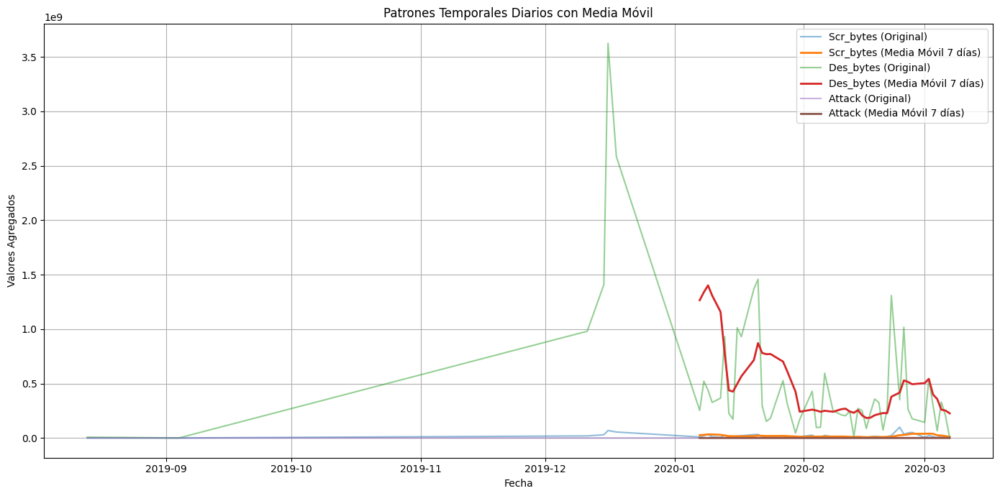

In [ ]:
# Definir las variables clave para el análisis
variables_temporales = ['Scr_bytes', 'Des_bytes', 'Attack']

# Agrupación temporal diaria basada en Timestamp
temporal_grouping = X_train.groupby(X_train['Timestamp'].dt.to_period('D'))[variables_temporales].sum()
temporal_grouping.index = temporal_grouping.index.to_timestamp()  # Convertir a datetime completo

# Aplicar media móvil para suavizar (ventana semanal por defecto)
window_size = 7  # Días
temporal_grouping_smooth = temporal_grouping.rolling(window=window_size).mean()

# Graficar los patrones temporales con media móvil
plt.figure(figsize=(14, 7))
for var in variables_temporales:
    plt.plot(temporal_grouping.index, temporal_grouping[var], label=f'{var} (Original)', alpha=0.5)
    plt.plot(temporal_grouping.index, temporal_grouping_smooth[var], label=f'{var} (Media Móvil {window_size} días)', lw=2)

# Configurar el gráfico
plt.title('Patrones Temporales Diarios con Media Móvil')
plt.xlabel('Fecha')
plt.ylabel('Valores Agregados')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


In [ ]:
# Detectar anomalías con Z-Score para cada columna
def detect_anomalies(df, columns, threshold=3):
    anomalies_dict = {}
    for col in columns:
        mean = df[col].mean()
        std = df[col].std()
        z_scores = (df[col] - mean) / std  # Calcular Z-Score
        anomalies_dict[col] = df[z_scores.abs() > threshold]  # Almacenar anomalías
    return anomalies_dict

# Definir las columnas a comprobar
columns_to_check = ['Scr_bytes', 'Des_bytes', 'Attack']

# Identificar anomalías
anomalies = detect_anomalies(temporal_grouping, columns_to_check)

# Mostrar las fechas con anomalías detectadas
for col, anomaly_df in anomalies.items():
    print(f"Anomalías detectadas en {col}:")
    print(f"{anomaly_df}\n")



Anomalías detectadas en Scr_bytes:
             Scr_bytes    Des_bytes  Attack
Timestamp                                  
2020-02-24  99112050.0  350928353.0   61808

Anomalías detectadas en Des_bytes:
             Scr_bytes     Des_bytes  Attack
Timestamp                                   
2019-12-16  68308943.0  3.624155e+09       0
2019-12-18  54690287.0  2.583685e+09       0

Anomalías detectadas en Attack:
             Scr_bytes    Des_bytes  Attack
Timestamp                                  
2020-02-24  99112050.0  350928353.0   61808






# <font color='Red'>Analisis exploratorio sobre ataques</font>





## Tiempo promedio entre ataques

In [ ]:
# Filtrar solo los eventos de ataque (Attack == 1)
attacks = X_train[(X_train['anomaly_alert'] == True) & (X_train['OSSEC_alert'] == True) & (X_train['Attack'] == 1)]

# Asegurarse de que la columna 'Timestamp' sea de tipo datetime
attacks['Timestamp'] = pd.to_datetime(attacks['Timestamp'], errors='coerce')

# Ordenar los eventos de ataque por la columna 'Timestamp'
attacks = attacks.sort_values(by='Timestamp')

# Calcular la diferencia de tiempo entre los eventos de ataque consecutivos
attacks['Time_diff'] = attacks['Timestamp'].diff().dt.total_seconds()

# Filtrar los valores nulos (si los hubiera) en la columna 'Time_diff' (pueden surgir si hay valores NaT)
attacks = attacks.dropna(subset=['Time_diff'])

# Calcular el tiempo promedio entre ataques
average_time_between_attacks = attacks['Time_diff'].mean()

# Mostrar el promedio
print(f"El tiempo promedio entre ataques es: {average_time_between_attacks:.2f} segundos.")


El tiempo promedio entre ataques es: 832.60 segundos.


<ipython-input-53-a82bc092069c>:5: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



## Análisis del Impacto del Tamaño de Tráfico y Duración en la Presencia de Ataques

In [ ]:
# Selección de las variables numéricas
selected_columns = ['Scr_bytes', 'Des_bytes', 'Duration']

# Crear gráfico de dispersión 3D con Plotly
fig = px.scatter_3d(X_train, x=selected_columns[0], y=selected_columns[1], z=selected_columns[2],
                    color='Attack',  # Colorear los puntos según la variable 'Attack'
                    title="Relación entre Scr_bytes, Des_bytes y Duration (coloreado por Attack)",
                    labels={selected_columns[0]: 'Scr_bytes', selected_columns[1]: 'Des_bytes', selected_columns[2]: 'Duration'},
                    color_continuous_scale='Viridis')  # Escala de colores

# Mostrar el gráfico interactivo
fig.show()


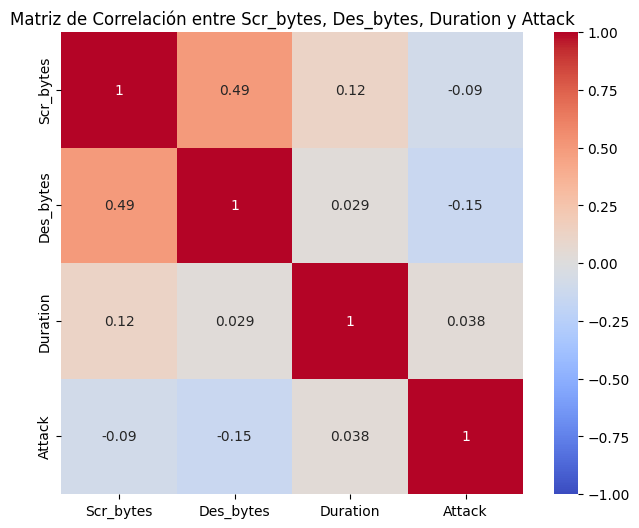

In [ ]:
# Calcular la matriz de correlación entre Scr_bytes, Des_bytes, Duration y Attack
correlation_matrix = X_train[selected_columns + ['Attack']].corr()

# Crear un mapa de calor para visualizar la matriz de correlación
plt.figure(figsize=(8, 6))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', vmin=-1, vmax=1, center=0, cbar=True, square=True)

# Añadir título y etiquetas
plt.title("Matriz de Correlación entre Scr_bytes, Des_bytes, Duration y Attack")
plt.show()

## Servicio con mas ataques

In [ ]:
# Filtrar las filas donde la alerta de anomalía es 'true' y es un ataque
attacks = X_train[(X_train['anomaly_alert'] == True) & (X_train['OSSEC_alert'] == True) & (X_train['Attack'] == 1)]

# Calcular el tipo de servicio con más ataques en las anomalías
most_common_service = attacks['Service'].value_counts() #.idxmax()

# Mostrar el tipo de servicio con más ataques
print(f"El tipo de servicio con más ataques es: {most_common_service}.")

El tipo de servicio con más ataques es: Service
ssh     1178
http     167
Name: count, dtype: int64.


## Protocolo con mas ataques

In [ ]:
attacks = X_train[(X_train['anomaly_alert'] == True) & (X_train['OSSEC_alert'] == True) & (X_train['Attack'] == 1)]

# Calcular el tipo de servicio con más ataques
most_common_protocol = attacks['Protocol'].value_counts() #.idxmax()

# Mostrar el tipo de servicio con más ataques
print(f"El tipo de protocolo con más ataques es: {most_common_protocol}.")

El tipo de protocolo con más ataques es: Protocol
tcp    1345
Name: count, dtype: int64.


## IPs con mas ataques

In [ ]:
attacks = X_train[(X_train['anomaly_alert'] == True) & (X_train['OSSEC_alert'] == True) & (X_train['Attack'] == 1)]

# Calcular el tipo de servicio con más ataques
most_common_Scr = attacks['Scr_IP'].value_counts()

# Mostrar el tipo de servicio con más ataques
print(f"IP Src con más ataques es: {most_common_Scr}.")

IP Src con más ataques es: Scr_IP
192.168.2.199    1345
Name: count, dtype: int64.


In [ ]:
# Calcular el tipo de servicio con más ataques
most_common_Des = attacks['Des_IP'].value_counts()

# Mostrar el tipo de servicio con más ataques
print(f"IP Des con más ataques es: {most_common_Des}.")

IP Des con más ataques es: Des_IP
192.168.2.10    1345
Name: count, dtype: int64.


## Tipos de ataque

In [ ]:
# attacks['Tipo_ataque'] = df_converted.loc[attacks.index, 'class2']
# attacks['Subtipo_ataque'] = df_converted.loc[attacks.index, 'class1']
X_train['Tipo_ataque'] = df_converted.loc[attacks.index, 'class2']
X_train['Subtipo_ataque'] = df_converted.loc[attacks.index, 'class1']

In [ ]:
# Filtrar los ataques relevantes en X_train
attacks = X_train[(X_train['anomaly_alert'] == True) &
                  (X_train['OSSEC_alert'] == True) &
                  (X_train['Attack'] == 1)]

attack_subtype_counts = attacks.groupby(['Tipo_ataque', 'Subtipo_ataque']).size().reset_index(name='count')

most_common_subtype_per_type = attack_subtype_counts.loc[attack_subtype_counts.groupby('Tipo_ataque')['count'].idxmax()]

for idx, row in most_common_subtype_per_type.iterrows():
    print(f"Tipo de Ataque: {row['Tipo_ataque']} - Subtipo de Ataque más común: {row['Subtipo_ataque']} con {row['count']} ataques.")


Tipo de Ataque: reconnaissance - Subtipo de Ataque más común: scanning_vulnerability con 776 ataques.
Tipo de Ataque: weaponization - Subtipo de Ataque más común: dictionary con 569 ataques.


<ipython-input-62-cd03bcbe7e8b>:2: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




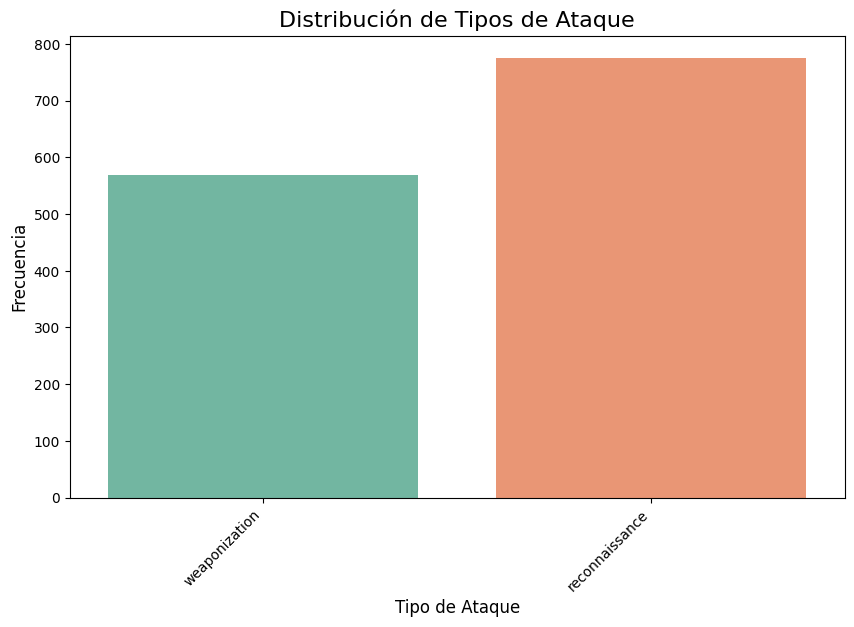

<ipython-input-62-cd03bcbe7e8b>:10: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




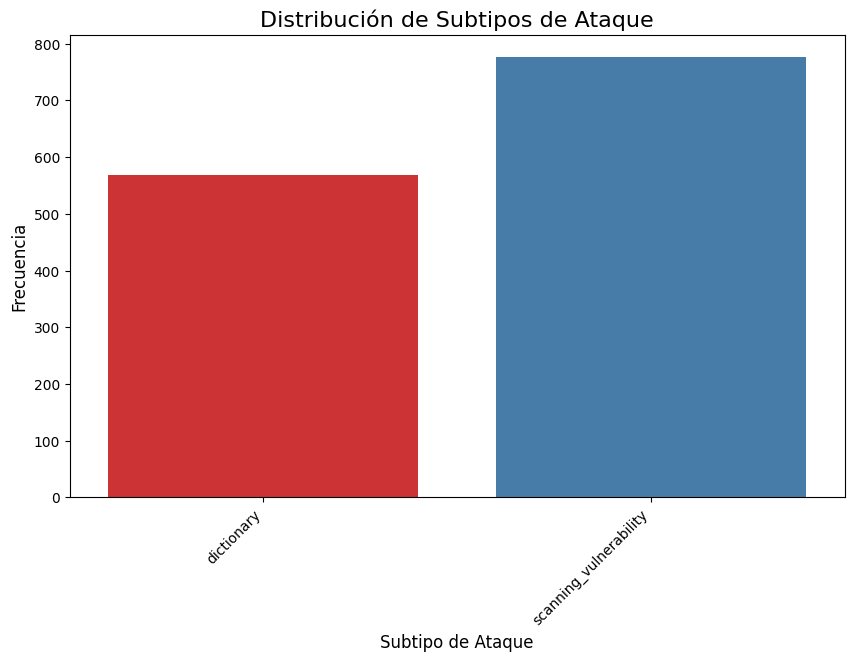

In [ ]:
plt.figure(figsize=(10, 6))
sns.countplot(data=X_train, x='Tipo_ataque', palette='Set2')
plt.title('Distribución de Tipos de Ataque', fontsize=16)
plt.xlabel('Tipo de Ataque', fontsize=12)
plt.ylabel('Frecuencia', fontsize=12)
plt.xticks(rotation=45, ha='right')
plt.show()

plt.figure(figsize=(10, 6))
sns.countplot(data=X_train, x='Subtipo_ataque', palette='Set1')
plt.title('Distribución de Subtipos de Ataque', fontsize=16)
plt.xlabel('Subtipo de Ataque', fontsize=12)
plt.ylabel('Frecuencia', fontsize=12)
plt.xticks(rotation=45, ha='right')
plt.show()

<ipython-input-63-68b3cc9bd935>:14: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.


<ipython-input-63-68b3cc9bd935>:22: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




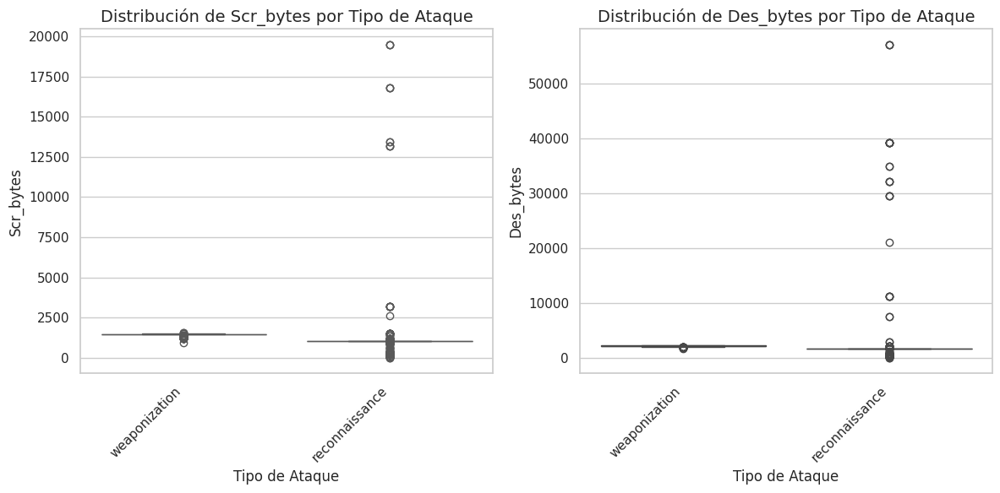

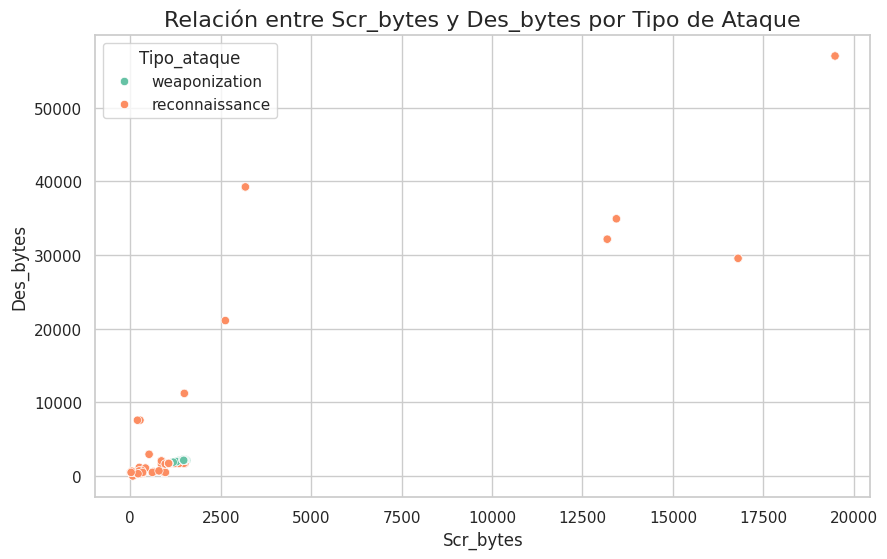

<ipython-input-63-68b3cc9bd935>:41: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



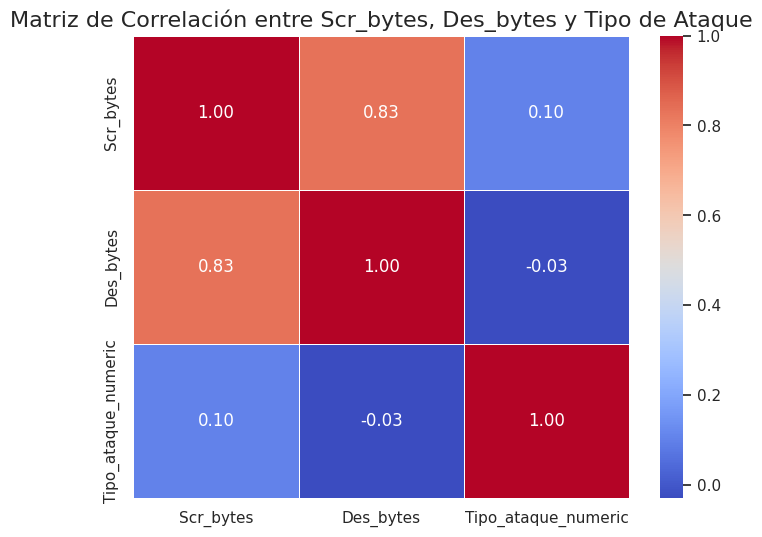

In [ ]:
# Configurar el estilo de los gráficos
sns.set(style="whitegrid")

# Filtrar ataques relevantes en X_train
attacks = X_train[(X_train['anomaly_alert'] == True) &
                  (X_train['OSSEC_alert'] == True) &
                  (X_train['Attack'] == 1)]

# 1. Distribución de Scr_bytes y Des_bytes por Tipo de Ataque
plt.figure(figsize=(12, 6))

# Graficar Scr_bytes por Tipo de Ataque
plt.subplot(1, 2, 1)
sns.boxplot(data=attacks, x='Tipo_ataque', y='Scr_bytes', palette='Set2')
plt.title('Distribución de Scr_bytes por Tipo de Ataque', fontsize=14)
plt.xlabel('Tipo de Ataque', fontsize=12)
plt.ylabel('Scr_bytes', fontsize=12)
plt.xticks(rotation=45, ha='right')

# Graficar Des_bytes por Tipo de Ataque
plt.subplot(1, 2, 2)
sns.boxplot(data=attacks, x='Tipo_ataque', y='Des_bytes', palette='Set1')
plt.title('Distribución de Des_bytes por Tipo de Ataque', fontsize=14)
plt.xlabel('Tipo de Ataque', fontsize=12)
plt.ylabel('Des_bytes', fontsize=12)
plt.xticks(rotation=45, ha='right')

plt.tight_layout()
plt.show()

# 2. Relación entre Scr_bytes y Des_bytes según Tipo de Ataque
plt.figure(figsize=(10, 6))
sns.scatterplot(data=attacks, x='Scr_bytes', y='Des_bytes', hue='Tipo_ataque', palette='Set2')
plt.title('Relación entre Scr_bytes y Des_bytes por Tipo de Ataque', fontsize=16)
plt.xlabel('Scr_bytes', fontsize=12)
plt.ylabel('Des_bytes', fontsize=12)
plt.show()

# 3. Análisis de correlación entre Scr_bytes, Des_bytes y el tipo de ataque
# Convertimos Tipo_ataque a números para calcular la correlación
attacks['Tipo_ataque_numeric'] = attacks['Tipo_ataque'].astype('category').cat.codes

# Calcular la correlación entre Scr_bytes, Des_bytes y Tipo_ataque_numeric
correlation = attacks[['Scr_bytes', 'Des_bytes', 'Tipo_ataque_numeric']].corr()

# Mostrar la matriz de correlación
plt.figure(figsize=(8, 6))
sns.heatmap(correlation, annot=True, cmap='coolwarm', fmt='.2f', linewidths=0.5)
plt.title('Matriz de Correlación entre Scr_bytes, Des_bytes y Tipo de Ataque', fontsize=16)
plt.show()


# <font color='Red'>Pruebas</font>

In [141]:
X_train = X_train.drop(columns=['Day_of_week', 'Month', 'Year', 'Hour', 'Minute', 'Second', 'Traffic', 'Attack', 'Tipo_ataque', 'Subtipo_ataque'], errors='ignore')
X_train.shape

(655345, 65)

In [142]:
X_train = X_train.drop(columns=['Date','Timestamp'], errors='ignore')
X_test = X_test.drop(columns=['Date','Timestamp'], errors='ignore')
X_train.shape

(655345, 63)

In [143]:
# Identificar columnas categóricas, numéricas y booleanas
categorical_cols = X_train.select_dtypes(include=['object']).columns
numerical_cols = X_train.select_dtypes(include=['float64', 'int64']).columns
boolean_cols = X_train.select_dtypes(include=['bool']).columns

if boolean_cols.any():  # Si hay columnas booleanas
    X_train[boolean_cols] = X_train[boolean_cols].astype(int)

# Definir los transformadores para las columnas numéricas y categóricas
numerical_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='mean')),  # Imputar valores nulos con la media
    ('scaler', RobustScaler())  # Escalar los datos
])

categorical_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='most_frequent')),  # Imputar valores nulos con la moda
    ('onehot', OneHotEncoder(sparse_output=False, handle_unknown="ignore"))  # Codificar las categorías
])

# Crear el ColumnTransformer para aplicar las transformaciones de manera independiente
preprocessor = ColumnTransformer(
    transformers=[
        ('num', numerical_transformer, numerical_cols),  # Aplicar a las columnas numéricas
        ('cat', categorical_transformer, categorical_cols)  # Aplicar a las columnas categóricas
    ])


In [144]:
# Crear el pipeline que incluye tanto el preprocesamiento como el modelo
pipeline = Pipeline(steps=[
    ('preprocessor', preprocessor),  # Primero, aplica las transformaciones
    ('model', RandomForestClassifier(max_depth=3, random_state=random_state))  # Luego, ajusta el modelo
])

In [145]:
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import accuracy_score, confusion_matrix

# Entrenar el modelo con el pipeline
pipeline.fit(X_train, y_train)

# Realizar predicciones
y_pred = pipeline.predict(X_test)

# Evaluar el rendimiento del modelo
accuracy = accuracy_score(y_test, y_pred)
print(f'Accuracy: {accuracy:.4f}')

Accuracy: 0.9100


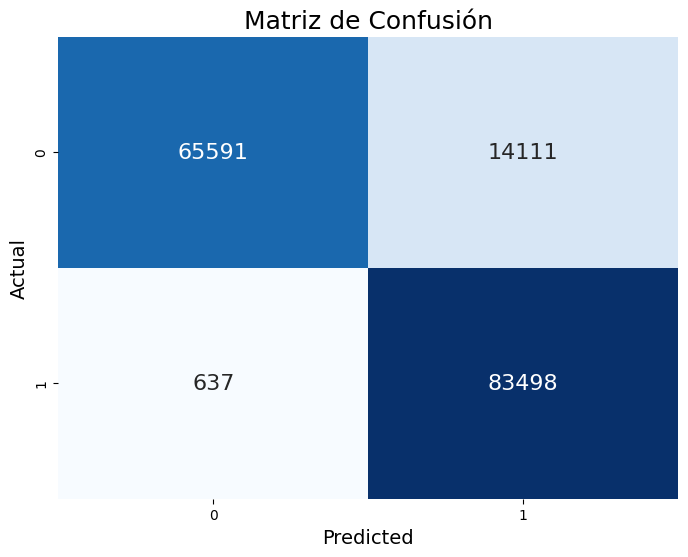

In [146]:
# Crear la matriz de confusión
cm = confusion_matrix(y_test, y_pred)

# Reordenar la matriz de confusión (si es necesario, por ejemplo, si la clase positiva es 1)
cm_reordered = cm[[1, 0], :][:, [1, 0]]

# Visualización de la matriz de confusión con un mapa de calor
plt.figure(figsize=(8, 6))
sns.heatmap(cm_reordered, annot=True, fmt='d', cmap='Blues', cbar=False, annot_kws={"size": 16})
plt.title("Matriz de Confusión", fontsize=18)
plt.xlabel('Predicted', fontsize=14)
plt.ylabel('Actual', fontsize=14)

# Mostrar el gráfico
plt.show()


<ipython-input-70-3054de726321>:14: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.




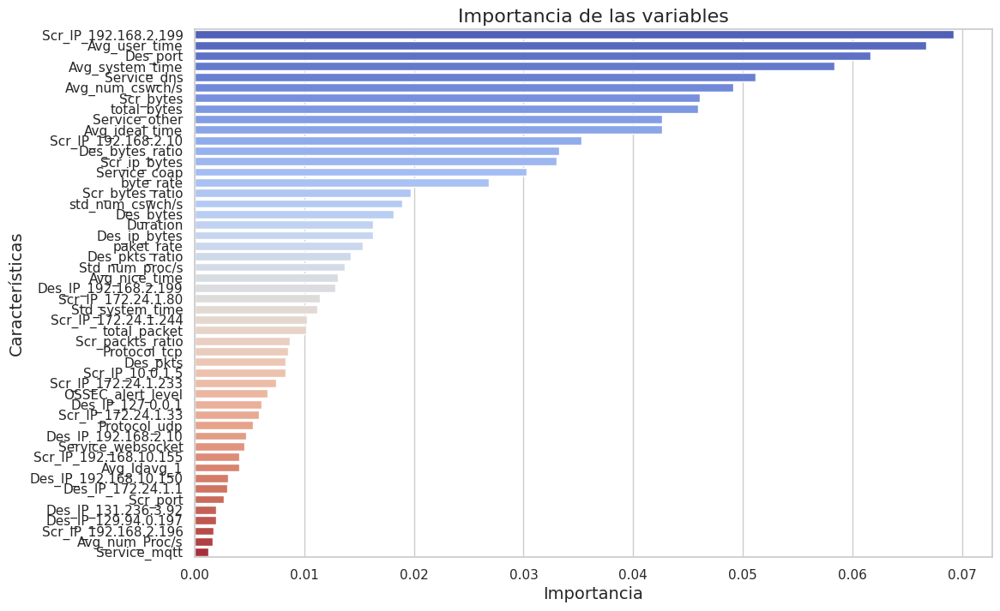

In [ ]:
importancia = pipeline.named_steps['model'].feature_importances_
feature_names = numerical_cols.tolist() + pipeline.named_steps['preprocessor'].transformers_[1][1].named_steps['onehot'].get_feature_names_out(categorical_cols).tolist()

importancia_df = pd.DataFrame({
    'feature': feature_names,
    'importance': importancia
})

importancia_df = importancia_df.sort_values(by='importance', ascending=False)

importancia_df_top = importancia_df.head(50)

plt.figure(figsize=(12, 8))
sns.barplot(x='importance', y='feature', data=importancia_df_top, palette='coolwarm')

plt.title("Importancia de las variables", fontsize=16)
plt.xlabel("Importancia", fontsize=14)
plt.ylabel("Características", fontsize=14)

# Mostrar el gráfico
plt.show()

In [ ]:
top_features = importancia_df.head(10)['feature'].tolist()
print(top_features)

['Scr_IP_192.168.2.199', 'Avg_user_time', 'Des_port', 'Avg_system_time', 'Service_dns', 'Avg_num_cswch/s', 'Scr_bytes', 'total_bytes', 'Service_other', 'Avg_ideal_time']


In [ ]:
# Primero, transformamos las columnas numéricas usando un scaler
scaler = StandardScaler()
X_train_numerical = scaler.fit_transform(X_train[numerical_cols])

# Ahora codificamos las columnas categóricas
encoder = OneHotEncoder(sparse_output=False)
X_train_encoded = encoder.fit_transform(X_train[categorical_cols])

# Obtener los nombres de las columnas codificadas
encoded_column_names = encoder.get_feature_names_out(categorical_cols)

# Convertir las matrices a DataFrames
X_train_numerical_df = pd.DataFrame(X_train_numerical, columns=numerical_cols)
X_train_encoded_df = pd.DataFrame(X_train_encoded, columns=encoded_column_names)

# Concatenar las columnas numéricas y codificadas
X_train_combined_df = pd.concat([X_train_numerical_df, X_train_encoded_df], axis=1)
X_train_combined_df['Timestamp'] = X['Timestamp'].reset_index(drop=True)  # Asegurar que el índice coincida

In [ ]:
# Mostrar las primeras filas del DataFrame combinado con las características seleccionadas y el 'Timestamp'
print(X_train_combined_df[top_features + ['Timestamp']].head())

   Scr_IP_192.168.2.199  Avg_user_time  Des_port  Avg_system_time  \
0                   0.0       0.482894 -0.408221        -0.154990   
1                   0.0      -0.543681 -0.413941        -0.600728   
2                   0.0       0.452395 -0.413941        -0.520152   
3                   0.0      -0.430501 -0.026864        -0.488069   
4                   0.0      -0.489051 -0.026228        -0.582115   

   Service_dns  Avg_num_cswch/s  Scr_bytes  total_bytes  Service_other  \
0          0.0        -0.381607   0.643070     0.348409            0.0   
1          1.0        -0.480727  -0.254182    -0.178997            0.0   
2          1.0        -0.437804  -0.254182    -0.178696            0.0   
3          0.0        -0.426358  -0.119440    -0.173400            0.0   
4          0.0        -0.462912  -0.263706    -0.178967            0.0   

   Avg_ideal_time     Timestamp  
0       -0.084711  1.578541e+09  
1        0.411859  1.578872e+09  
2        0.109423  1.578522e+09  
3   

In [ ]:
# Crear y entrenar el modelo IsolationForest
iso_forest = IsolationForest(random_state=42)
iso_forest.fit(X_train_combined_df[top_features])

# Generar predicciones: 1 = normal, -1 = anomalías
predictions = iso_forest.predict(X_train_combined_df[top_features])

# Agregar las predicciones al DataFrame
X_train_combined_df['Anomaly'] = predictions

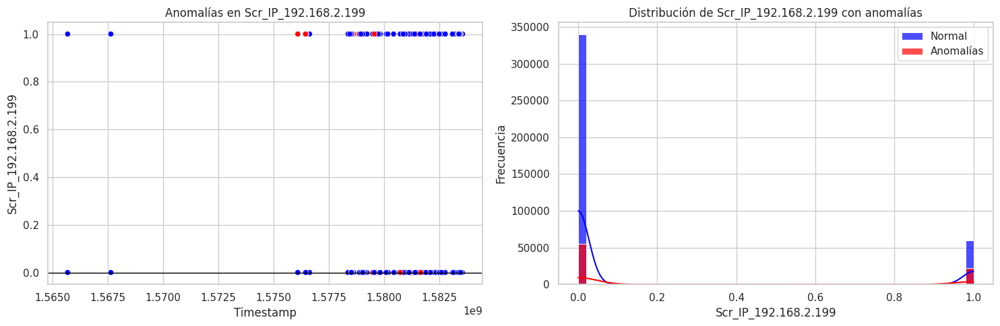

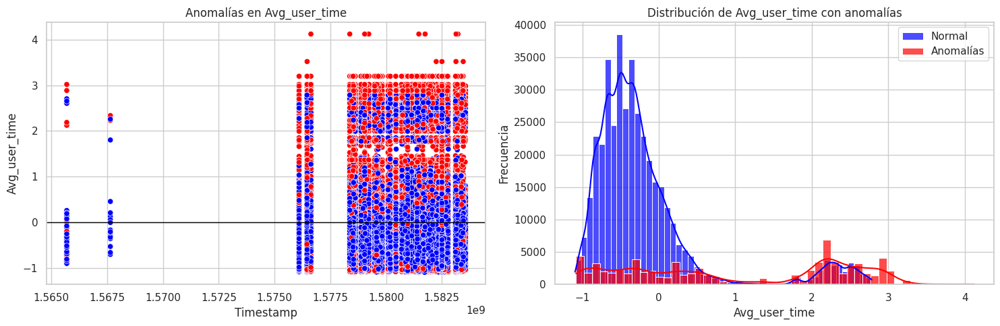

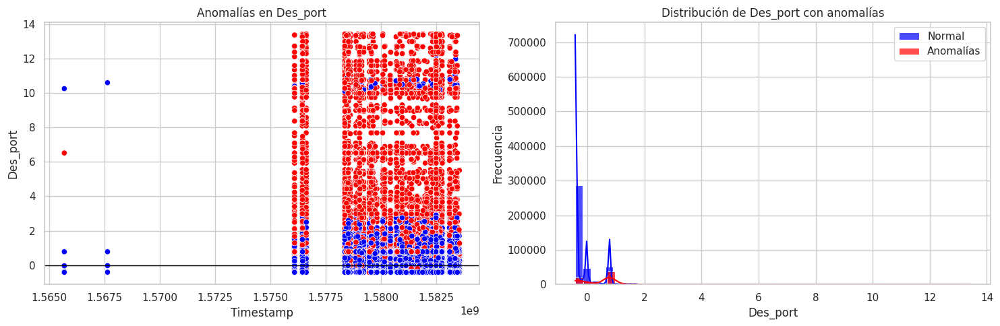

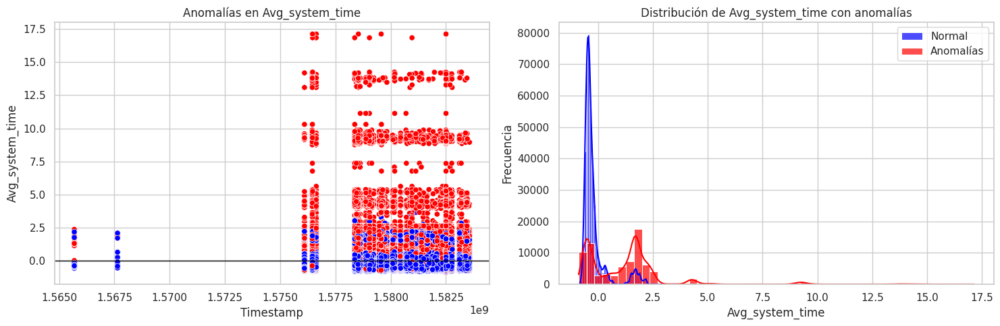

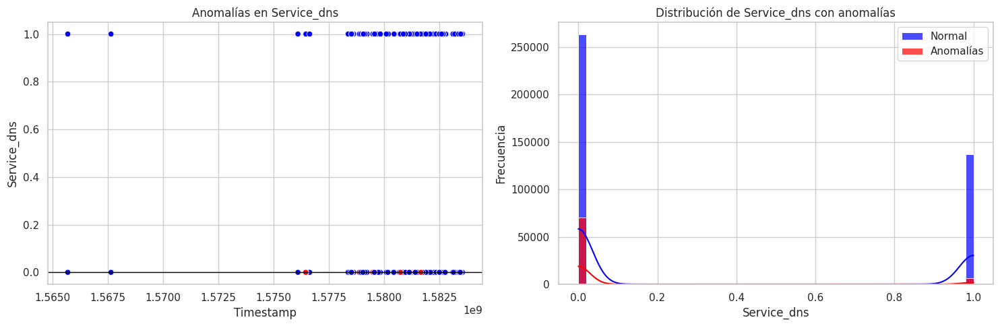

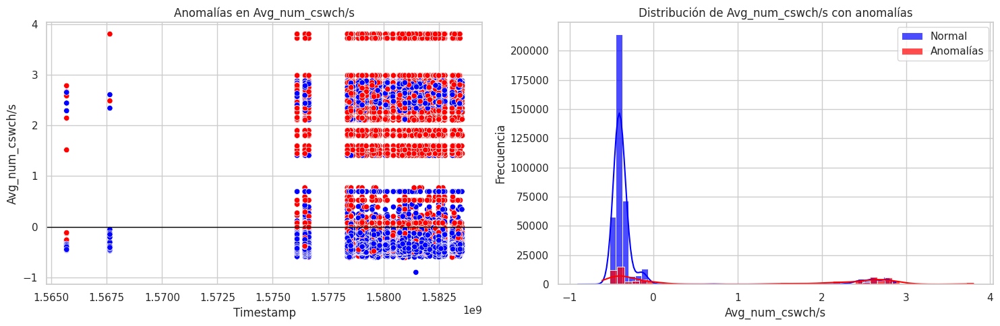

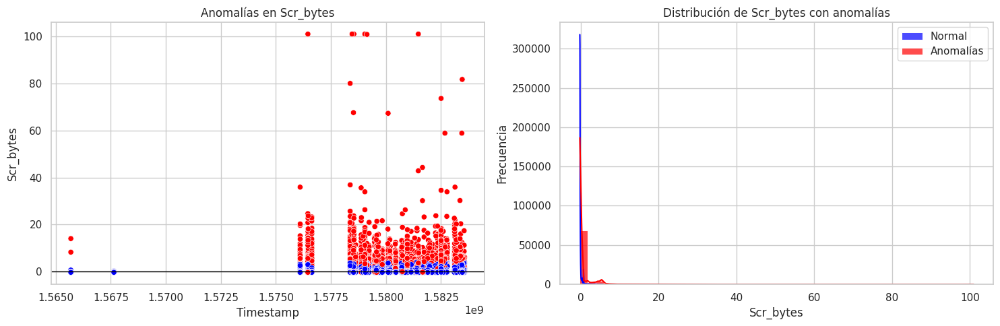

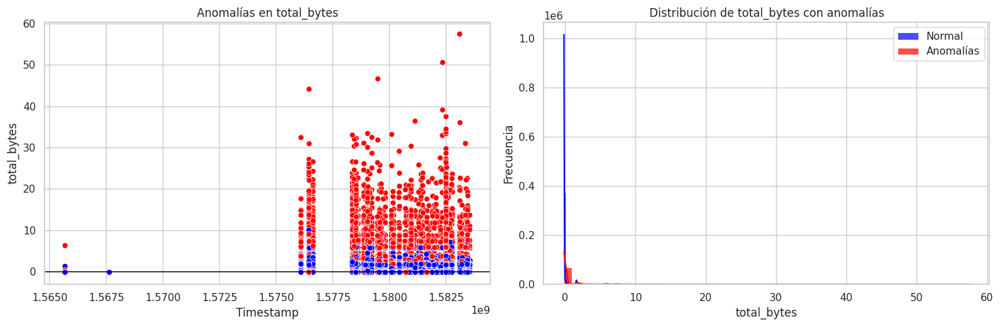

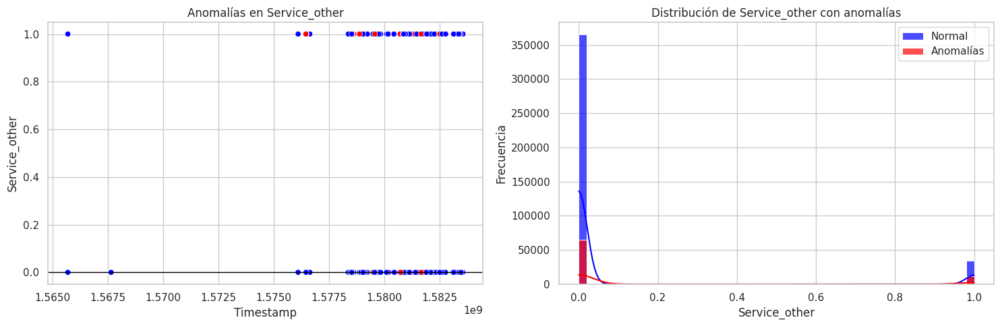

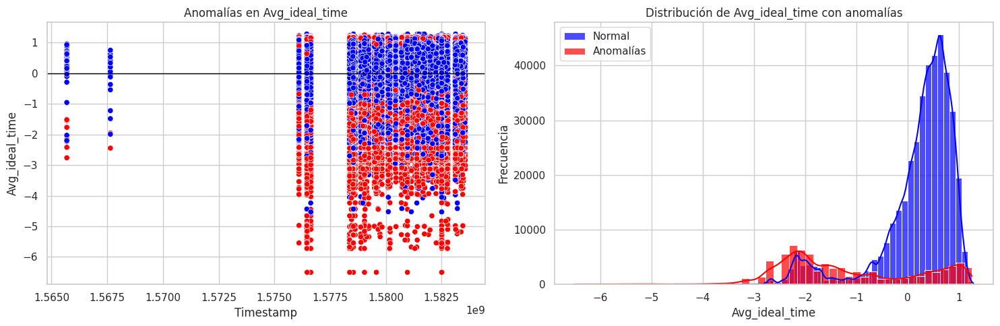

In [ ]:
# Visualizar las anomalías con subgráficos, separando las gráficas en diferentes figuras
for i, feature in enumerate(top_features):
    # Crear una nueva figura para cada conjunto de gráficos de cada característica
    plt.figure(figsize=(15, 5))

    # Subgráfico para la dispersión con Timestamp en el eje x
    plt.subplot(1, 2, 1)  # 1 fila, 2 columnas, gráfico 1 (anomalías)
    sns.scatterplot(x=X_train_combined_df['Timestamp'],
                    y=X_train_combined_df[feature],
                    hue=X_train_combined_df['Anomaly'],
                    palette={1: 'blue', -1: 'red'},
                    legend=False)
    plt.title(f'Anomalías en {feature}')
    plt.xlabel('Timestamp')
    plt.ylabel(feature)
    plt.axhline(0, color='black', linewidth=1)

    # Subgráfico para el histograma
    plt.subplot(1, 2, 2)  # 1 fila, 2 columnas, gráfico 2 (distribución)
    sns.histplot(X_train_combined_df[X_train_combined_df['Anomaly'] == 1][feature],
                 kde=True, color='blue', label='Normal', bins=50, alpha=0.7)
    sns.histplot(X_train_combined_df[X_train_combined_df['Anomaly'] == -1][feature],
                 kde=True, color='red', label='Anomalías', bins=50, alpha=0.7)
    plt.title(f'Distribución de {feature} con anomalías')
    plt.xlabel(feature)
    plt.ylabel('Frecuencia')
    plt.legend()

    # Ajustar el diseño para evitar superposición de subgráficos
    plt.tight_layout()

    # Mostrar el gráfico
    plt.show()
